# Streaming Data Management and Time Series Analysis
## 2020-2021
## Simionato Gianluca

# SARIMA

In [137]:
import pandas as pd
import glob
import os
import time
import numpy as np
from datetime import date, timedelta
import utils

# Forecasting time series with complex seasonal patterns
from tbats import TBATS, BATS

# Load mooving average methods
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing

# Load specific forecasting tools
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.eval_measures import mse,rmse
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf 
from statsmodels.tsa.seasonal import seasonal_decompose      
import pmdarima                            
from statsmodels.tsa.stattools import adfuller

# Load specific clustering tools
from minisom import MiniSom
from tslearn.barycenters import dtw_barycenter_averaging
from tslearn.clustering import TimeSeriesKMeans
from sklearn.cluster import KMeans

# Load specific evaluation tools
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from statsmodels.tools.eval_measures import rmse

from tensorflow.signal import rfft

# Load fbprophet
from fbprophet import Prophet

import matplotlib.pyplot as plt
import math
from datetime import date, timedelta
import dateutil.relativedelta as relativedelta
import holidays

# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show", DeprecationWarning)

pd.options.plotting.backend = 'matplotlib'
plt.style.use('default')

In [138]:
wpath = r'C:\Users\gianluca.simionato\Desktop\DS\StreamingDataManagement_TimeSeriesAnalysis\PROJECT'
os.chdir(wpath)

In [139]:
df_orig = pd.read_csv('TrainingSet.csv', sep = ';', decimal = ',')
df_orig['YEAR'] = df_orig['DATA'].str[:4]
df_orig['MONTH'] = df_orig['DATA'].str[5:7]
df_orig['DAY'] = df_orig['DATA'].str[8:]
df_orig['Ora'] = df_orig['Ora'] -1

In [140]:
df_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17518 entries, 0 to 17517
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   DATA    17518 non-null  object
 1   Ora     17518 non-null  int64 
 2   VALORE  17518 non-null  int64 
 3   YEAR    17518 non-null  object
 4   MONTH   17518 non-null  object
 5   DAY     17518 non-null  object
dtypes: int64(2), object(4)
memory usage: 821.3+ KB


In [141]:
df_orig['DATE_TIME'] = pd.to_datetime({'YEAR':df_orig['YEAR'], 'MONTH':df_orig['MONTH'], 'DAY':df_orig['DAY'], 'HOUR':df_orig['Ora']})

### Calendario festività

In [142]:
df_orig["Year"] = df_orig['DATE_TIME'].dt.year
df_orig["DATA"] = df_orig['DATE_TIME'].dt.date

In [143]:
year_list = list(df_orig["Year"].unique())
year_list

[2018, 2019, 2020]

In [144]:
holiday_date = []
holiday_name = []
for ptr in holidays.IT(years = year_list, prov='MI').items():
    holiday_date.append(ptr[0])
    holiday_name.append(ptr[1])
df_holiday = pd.DataFrame(list(zip(holiday_date, holiday_name)), columns =['DATA', 'holiday_name'])

In [145]:
start = df_orig['DATA'].min()
end = df_orig['DATA'].max() + pd.tseries.offsets.YearEnd()
end = end.date()
start, end

(datetime.date(2018, 9, 1), datetime.date(2020, 12, 31))

In [146]:
df_cal = pd.DataFrame({"DATA": pd.date_range(start, end)})
df_cal["Day"] = df_cal['DATA'].dt.day_name()
df_cal["Week"] = df_cal['DATA'].dt.weekofyear
df_cal["Month"] = df_cal['DATA'].dt.month
df_cal["Month_name"] = df_cal['DATA'].dt.month_name()
df_cal["Quarter"] = df_cal['DATA'].dt.quarter
df_cal["Year"] = df_cal['DATA'].dt.year

In [147]:
df_cal['DATA'] = df_cal['DATA'].astype(str)

In [148]:
df_cal_holiday = pd.merge(df_cal, df_holiday, how='left', on='DATA')
df_cal_holiday['dummy_holiday'] = np.where(df_cal_holiday['holiday_name']==df_cal_holiday['holiday_name'], 1, 0)
df_cal_holiday['dummy_Covid'] = np.where((df_cal_holiday['DATA'] > '2020-03-01') & (df_cal_holiday['DATA'] < '2020-07-01'), 1,
                              np.where((df_cal_holiday['DATA'] >= '2020-07-01') & (df_cal_holiday['DATA'] < '2020-10-26'),   0.5,
                              np.where(df_cal_holiday['DATA'] >= '2020-10-26',   1, 0)))

In [149]:
df_cal_holiday

,DATA,Day,Week,Month,Month_name,Quarter,Year,holiday_name,dummy_holiday,dummy_Covid
0,2018-09-01,Saturday,35,9,September,3,2018,NaN,0,0.0
1,2018-09-02,Sunday,35,9,September,3,2018,NaN,0,0.0
2,2018-09-03,Monday,36,9,September,3,2018,NaN,0,0.0
3,2018-09-04,Tuesday,36,9,September,3,2018,NaN,0,0.0
4,2018-09-05,Wednesday,36,9,September,3,2018,NaN,0,0.0
...,...,...,...,...,...,...,...,...,...,...
848,2020-12-27,Sunday,52,12,December,4,2020,NaN,0,1.0
849,2020-12-28,Monday,53,12,December,4,2020,NaN,0,1.0
850,2020-12-29,Tuesday,53,12,December,4,2020,NaN,0,1.0
851,2020-12-30,Wednesday,53,12,December,4,2020,NaN,0,1.0


Si ipotizza impatto Covid da Marzo a Luglio 2020, con seconde restrizioni a partire dal 26 Ottobre 2020

In [150]:
df = pd.merge(df_orig, df_holiday, how='left', on='DATA')
df['dummy_holiday'] = np.where(df['holiday_name'] == df['holiday_name'], 1, 0)
df['dummy_Covid'] = np.where((df['DATE_TIME'] > '2020-03-01') & (df['DATE_TIME'] < '2020-07-01'), 1,
                              np.where(df['DATE_TIME'] >= '2020-07-01',   0.5, 0))

In [151]:
df[(df.dummy_holiday==1) & (df.Ora==0)]

,DATA,Ora,VALORE,YEAR,MONTH,DAY,DATE_TIME,Year,holiday_name,dummy_holiday,dummy_Covid
1464,2018-11-01,0,3466082,2018,11,01,2018-11-01,2018,Tutti i Santi,1,0.0
2328,2018-12-07,0,3539475,2018,12,07,2018-12-07,2018,Sant'Ambrogio,1,0.0
2352,2018-12-08,0,3680464,2018,12,08,2018-12-08,2018,Immacolata Concezione,1,0.0
2760,2018-12-25,0,4216283,2018,12,25,2018-12-25,2018,Natale,1,0.0
2784,2018-12-26,0,3787853,2018,12,26,2018-12-26,2018,Santo Stefano,1,0.0
2928,2019-01-01,0,4391557,2019,01,01,2019-01-01,2019,Capodanno,1,0.0
3048,2019-01-06,0,4181281,2019,01,06,2019-01-06,2019,Epifania del Signore,1,0.0
5567,2019-04-21,0,3436132,2019,04,21,2019-04-21,2019,Pasqua di Resurrezione,1,0.0
5591,2019-04-22,0,3156972,2019,04,22,2019-04-22,2019,Lunedì dell'Angelo,1,0.0
5663,2019-04-25,0,3334208,2019,04,25,2019-04-25,2019,Festa della Liberazione,1,0.0


### Interpolo i dati mancanti

In [152]:
df = df.loc[:, ['DATE_TIME', 'VALORE', 'dummy_holiday', 'dummy_Covid']]

In [153]:
df.set_index('DATE_TIME', inplace= True)

In [154]:
print(f'Dimensioni dataframe originale : {df.shape}')
df_o = df.copy()
df = df.resample('H').mean().interpolate('linear')
print(f'Dimensioni dataframe completo : {df.shape}')

Dimensioni dataframe originale : (17518, 3)
Dimensioni dataframe completo : (17544, 3)


In [155]:
# dati mancanti
set(df.index).difference(set(df_o.index))

{Timestamp('2019-03-31 02:00:00', freq='H'),
 Timestamp('2020-03-29 02:00:00', freq='H'),
 Timestamp('2020-05-31 00:00:00', freq='H'),
 Timestamp('2020-05-31 01:00:00', freq='H'),
 Timestamp('2020-05-31 02:00:00', freq='H'),
 Timestamp('2020-05-31 03:00:00', freq='H'),
 Timestamp('2020-05-31 04:00:00', freq='H'),
 Timestamp('2020-05-31 05:00:00', freq='H'),
 Timestamp('2020-05-31 06:00:00', freq='H'),
 Timestamp('2020-05-31 07:00:00', freq='H'),
 Timestamp('2020-05-31 08:00:00', freq='H'),
 Timestamp('2020-05-31 09:00:00', freq='H'),
 Timestamp('2020-05-31 10:00:00', freq='H'),
 Timestamp('2020-05-31 11:00:00', freq='H'),
 Timestamp('2020-05-31 12:00:00', freq='H'),
 Timestamp('2020-05-31 13:00:00', freq='H'),
 Timestamp('2020-05-31 14:00:00', freq='H'),
 Timestamp('2020-05-31 15:00:00', freq='H'),
 Timestamp('2020-05-31 16:00:00', freq='H'),
 Timestamp('2020-05-31 17:00:00', freq='H'),
 Timestamp('2020-05-31 18:00:00', freq='H'),
 Timestamp('2020-05-31 19:00:00', freq='H'),
 Timestamp

In [156]:
print(f'Dimensioni dataframe dopo interpolazione valori mancanti : {df.shape}')

Dimensioni dataframe dopo interpolazione valori mancanti : (17544, 3)


In [157]:
# esportazione df
df.to_csv('DB.csv', sep=';', decimal=',')

# Visualizzazione Dati

In [158]:
df_1 = df[['VALORE']].copy()
df_1['year'] = df_1.index.year.astype(str)
df_1['Month'] = df_1.index.month.astype(str)
df_1['Day'] = df_1.index.weekday.astype(str)

<AxesSubplot:title={'center':'VALORE'}, xlabel='[year]'>

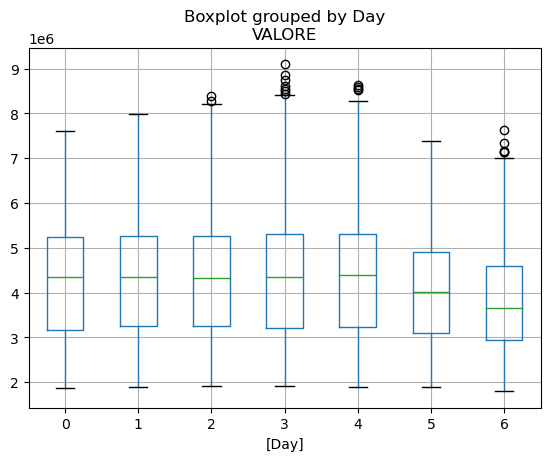

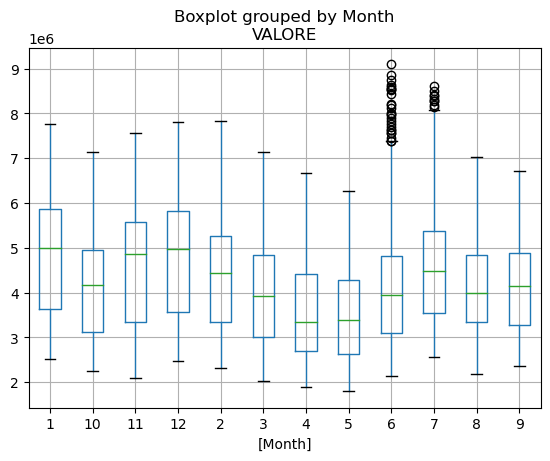

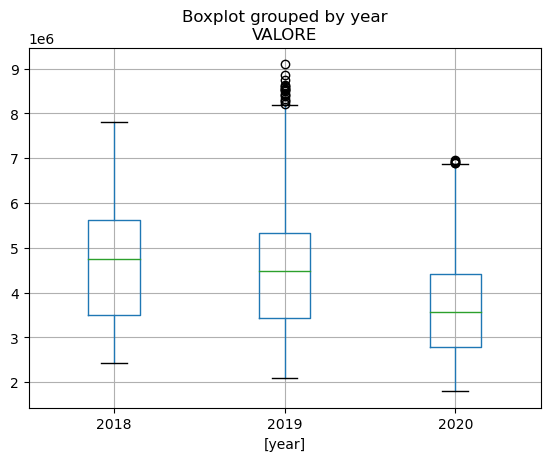

In [159]:
# BOXPLOT
df_1.boxplot(by='Day')
df_1.boxplot(by='Month')
df_1.boxplot(by='year')

<AxesSubplot:xlabel='DATE_TIME'>

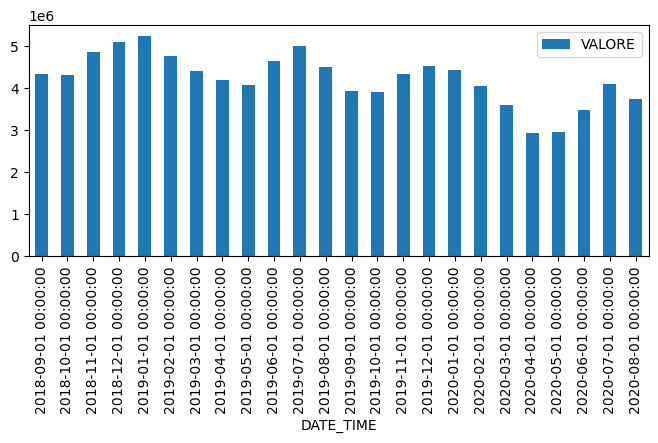

In [160]:
# BAR CHART
df_1.resample('MS').mean().plot.bar(figsize=(8,3))

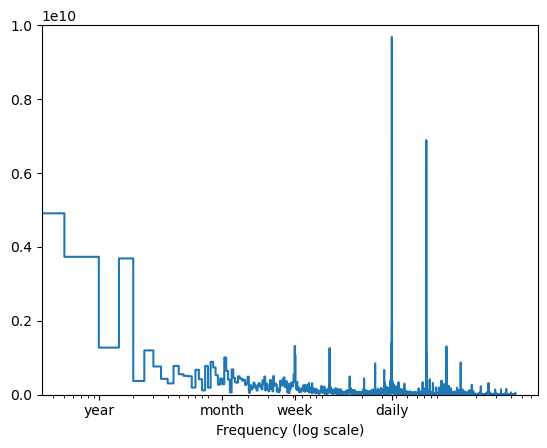

In [161]:
# fourier - frequency
fft = rfft(df_1['VALORE'])
f_per_dataset = np.arange(0, len(fft))
n_samples_h = len(df_1['VALORE'])
hours_per_year = 24*365.2524
years_per_dataset = n_samples_h/(hours_per_year)
f_per_year = f_per_dataset/years_per_dataset
plt.step(f_per_year, np.abs(fft))
plt.xscale('log')
plt.ylim(0, 1e10)
plt.xticks([1, 12, 52 ,365.2524], labels=['year', 'month', 'week', 'daily'])
_ = plt.xlabel('Frequency (log scale)')

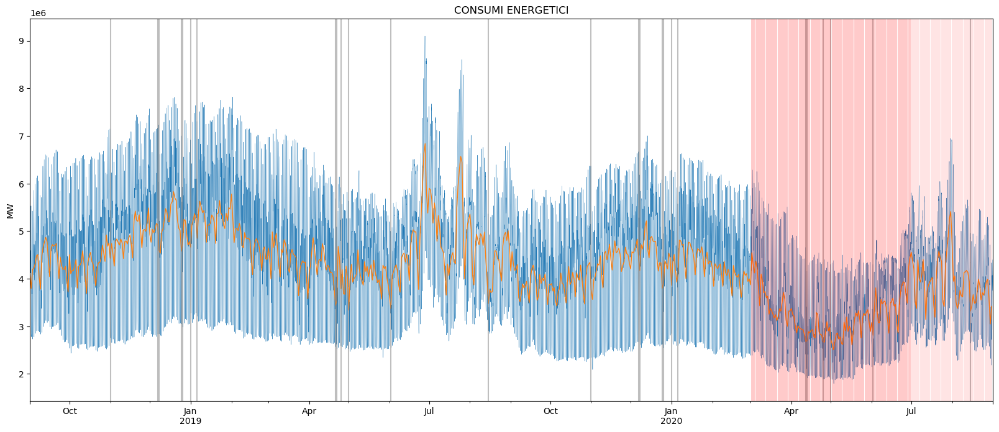

In [162]:
# LINE-CHART
title='CONSUMI ENERGETICI'
ylabel='MW'
xlabel='' 
df_1 = df.resample('d').mean()
ax = df[['VALORE']].plot(legend=False,figsize=(20,8), title=title, linewidth = 0.3)
df_1['VALORE'].plot(legend=False,figsize=(20,8), title=title, linewidth = 1)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
for x in df_1.query('dummy_holiday==1').index: 
    ax.axvline(x=x, color='grey', alpha=0.5)
for x in df_1.query('dummy_Covid==1').index: 
    ax.axvline(x=x, color='r', alpha=0.2)
for x in df_1.query('dummy_Covid==0.5').index: 
    ax.axvline(x=x, color='r', alpha=0.1)

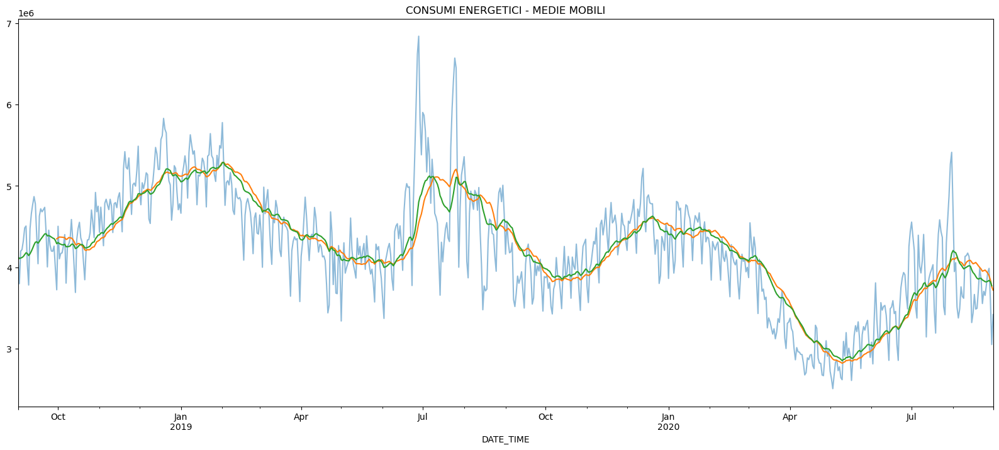

In [163]:
df_1['SMA30'] = df_1['VALORE'].rolling(window = 30).mean()
df_1['SES30'] = SimpleExpSmoothing(df_1['VALORE']).fit(smoothing_level=2/(30+1),optimized=False).fittedvalues.shift(-1)
df_1['VALORE'].plot(figsize=(20,8), alpha=0.5, title = 'CONSUMI ENERGETICI - MEDIE MOBILI').autoscale(axis='x',tight=True )
df_1['SMA30'].plot().autoscale(axis='x',tight=True)
df_1['SES30'].plot().autoscale(axis='x',tight=True)

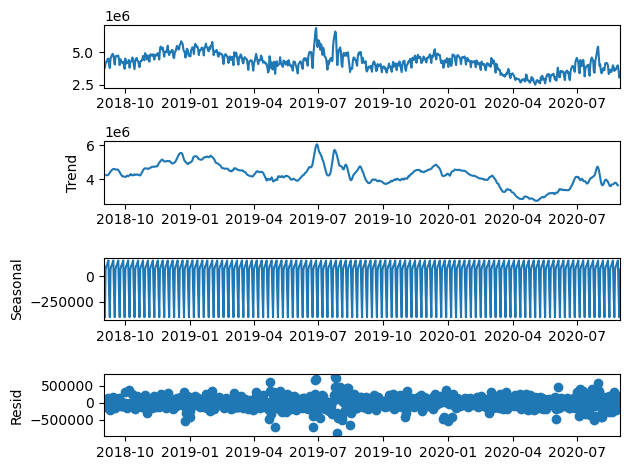

In [164]:
# ETS Decomposition
df_11 = df_1[['VALORE']]
df_11.index.freq = 'd'
result = seasonal_decompose(df_11, model='add')
result.plot();

In [165]:
list_hour = list(range(0,24))

In [166]:
df_ore = df[['VALORE']].copy()
df_ore.columns =['Y']
df_ore = df_ore.reset_index()
df_ore["Date"] = df_ore['DATE_TIME'].dt.date
df_ore["Day"] = df_ore['DATE_TIME'].dt.day_name()
df_ore["Week"] = df_ore['DATE_TIME'].dt.weekofyear
df_ore["Month"] = df_ore['DATE_TIME'].dt.month
df_ore["Month_name"] = df_ore['DATE_TIME'].dt.month_name()
df_ore["Quarter"] = df_ore['DATE_TIME'].dt.quarter
df_ore["Year"] = df_ore['DATE_TIME'].dt.year
df_ore["Hour"] = df_ore['DATE_TIME'].dt.hour
df_ore.set_index('Date', inplace=True)
list_hour = list(range(0,24))
list_df = [pd.DataFrame() for x in range(24)]

In [167]:
mySeries = []
namesofMySeries = []
for i in list_hour:
    list_df[i] = df_ore[df_ore['Hour'] == i][['Y']]
    mySeries.append(list_df[i])
    namesofMySeries.append(list_hour[i])

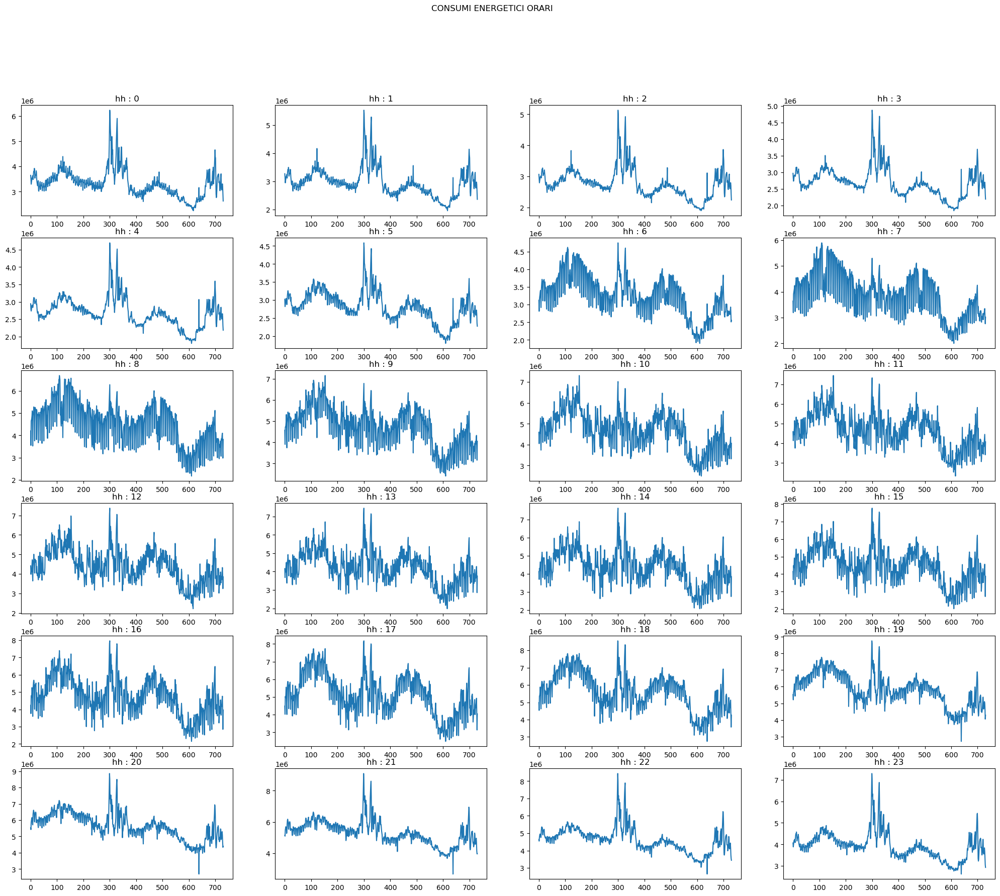

In [168]:
fig, axs = plt.subplots(6,4,figsize=(25,20))
fig.suptitle(f'CONSUMI ENERGETICI ORARI')
for i in range(6):
    for j in range(4):
        if i*4+j+1>len(mySeries): # pass the others that we can't fill
            continue
        axs[i, j].plot(mySeries[i*4+j].values)
        axs[i, j].set_title('hh : ' + str(namesofMySeries[i*4+j]))
plt.show()

# Forecasting

# 1.1 SARIMAX

E' necessario eseguire il forecast su ogni ora della serie storica per poter ottenere una curva oraria di valori futuri

## SARIMAX su valori medi giornalieri

In [169]:
def adf_test(series,title=f'CONSUMI ENERGETICI'):
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC') # .dropna() handles differenced data
    
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)

    for key,val in result[4].items():
        out[f'critical value ({key})']=val
        
    print(out.to_string())          # .to_string() removes the line "dtype: float64"
    
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

In [170]:
df_h = df.resample('d').mean()
df_h.index = df_h.index.date

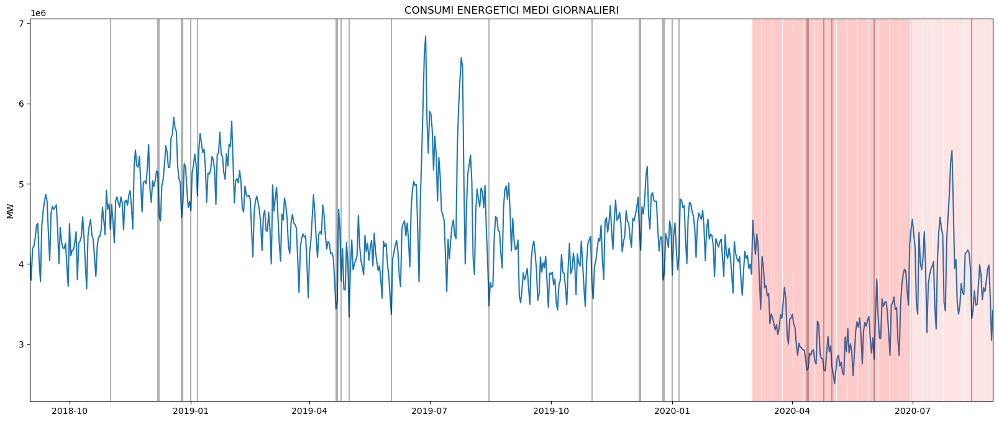

In [171]:
# Plot the source data
title=f'CONSUMI ENERGETICI MEDI GIORNALIERI'
ylabel='MW'
xlabel='' 
ax = df_h['VALORE'].plot(figsize=(20,8),title=title, legend=False)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);
for x in df_h.query('dummy_holiday==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3)
for x in df_h.query('dummy_Covid==1').index: 
    ax.axvline(x=x, color='r', alpha = 0.2)
for x in df_h.query('dummy_Covid==0.5').index: 
    ax.axvline(x=x, color='r', alpha = 0.1);

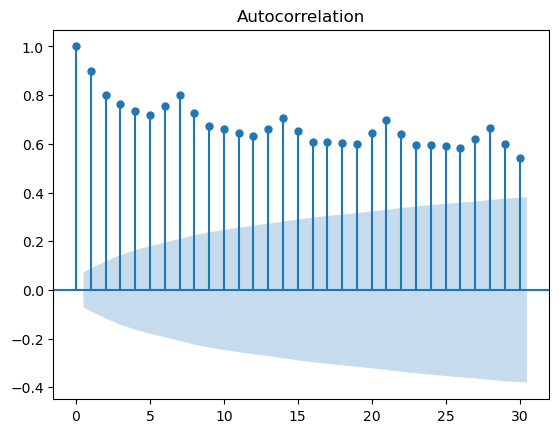

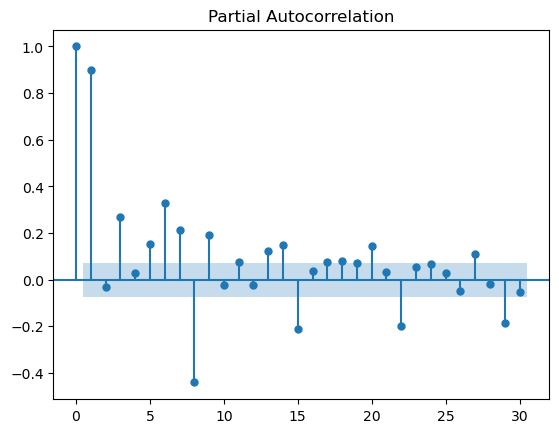

In [172]:
# Draw ACF and PACF Plot Charts
plot_acf(df_h[['VALORE']].values.squeeze(), lags=30)
plot_pacf(df_h[['VALORE']].values.squeeze(), lags=30)
plt.show()

In [173]:
adf_test(df_h['VALORE'])

Augmented Dickey-Fuller Test: CONSUMI ENERGETICI
ADF test statistic       -1.506152
p-value                   0.530466
# lags used              19.000000
# observations          711.000000
critical value (1%)      -3.439581
critical value (5%)      -2.865614
critical value (10%)     -2.568939
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [174]:
df_h.rename({'VALORE': 'Y'}, axis=1, inplace= True)

In [175]:
Msarima = pmdarima.auto_arima(y = df_h[['Y']],
                              exogenous = df_h[['dummy_holiday', 'dummy_Covid']],
                              seasonal = True, m = 7,
                              method = 'lbfgs',  
                              max_p = 2,
                              #start_p = 1, d = None, start_q = 1,
                              scoring = 'mae')

In [176]:
par = Msarima.get_params()
order = par['order']
seasonal_order = par['seasonal_order']

In [177]:
order, seasonal_order

((2, 1, 0), (1, 0, 1, 7))

In [178]:
exog = df_h[['dummy_holiday', 'dummy_Covid']]

In [179]:
model = SARIMAX(df_h[['Y']], exog=exog.values, order=order, seasonal_order=seasonal_order, trend='n')
results = model.fit()

In [180]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   Y   No. Observations:                  731
Model:             SARIMAX(2, 1, 0)x(1, 0, [1], 7)   Log Likelihood              -10074.954
Date:                             Thu, 03 Jun 2021   AIC                          20163.907
Time:                                     23:50:40   BIC                          20196.059
Sample:                                 09-01-2018   HQIC                         20176.312
                                      - 08-31-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1         -3.699e+05   8.54e-10  -4.33e+14      0.000    -3.7e+05    -3.7e+05
x2         -1.278e+05   8.17e-11  -1.56e+15      0.000   -1.28e+05   -1.28e+05
ar.L1          0.0314      0.036      0.883      0.377      -0.038       0.101
ar.L2         -0.1037      0.024     -4.322      0.000      -0.151      -0.057
ar.S.L7        0.9945      0.005    191.820      0.000       0.984       1.005
ma.S.L7       -0.9587      0.020    -48.968      0.000      -0.997      -0.920
sigma2      8.501e+10   2.42e-14   3.52e+24      0.000     8.5e+10     8.5e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.60   Jarque-Bera (JB):               173.17
Prob(Q):                              0.44   Prob(JB):                         0.00
Heteroskedasticity (H):               0.70   Skew:                            -0.31
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.77e+38. Standard errors may be unstable.
"""

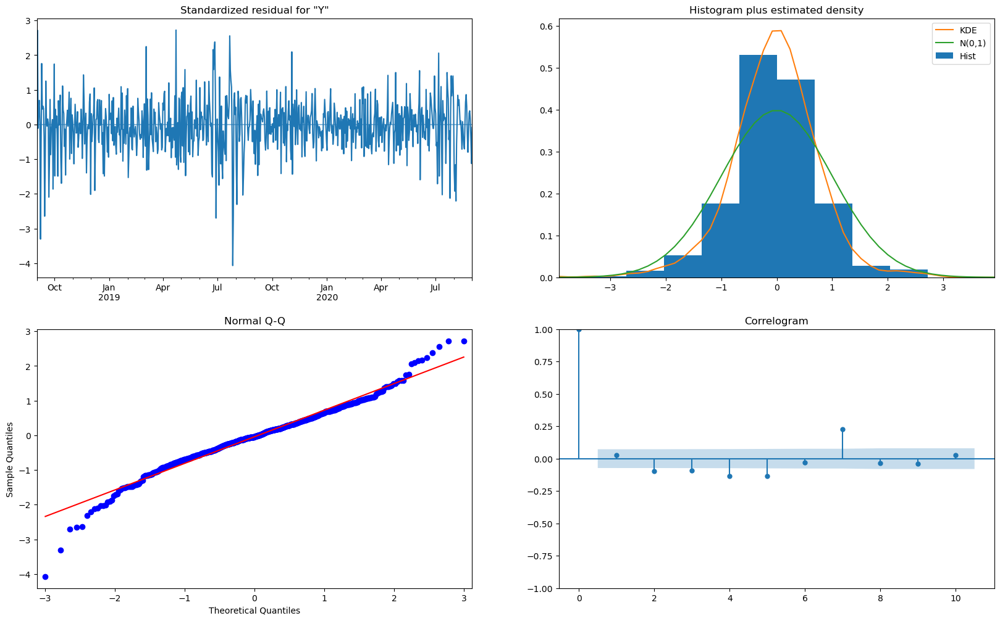

In [181]:
results.plot_diagnostics(figsize=(20, 12))
plt.show()

In [182]:
exog_params = results.params[model.k_trend:model.k_trend + model.k_exog]
exog_params

x1   -369923.052056
x2   -127770.591986
dtype: float64

In [183]:
exog_f = df_cal_holiday[['DATA', 'dummy_holiday', 'dummy_Covid']].copy()
exog_f['DATA'] = pd.to_datetime(exog_f['DATA'])
exog_f['DATA'] = exog_f['DATA'].dt.date

In [184]:
start = len(df_h) - 1
end = len(df_h) + 60
dif = end - start
start_ex = len(df_h)

In [185]:
exog_f_f = exog_f[(exog_f['DATA'] >= df_h.iloc[start :, : ].index[0]) & (exog_f['DATA'] <= df_h.iloc[start : , : ].index[0] + timedelta(days = dif))]
exog_f_f.set_index('DATA', inplace=True)
exog_f_f = exog_f_f.loc[df_h.iloc[-1:, : ].index[0] : , :].iloc[1:, :]

In [186]:
fcast = results.predict(start=start+1, end=end, exog= exog_f_f).rename(f'SARIMAX Forecast')

In [187]:
df_h['Y'], fcast

(2018-09-01    4.128740e+06
 2018-09-02    3.799029e+06
 2018-09-03    4.197913e+06
 2018-09-04    4.217695e+06
 2018-09-05    4.324142e+06
                   ...     
 2020-08-27    3.938025e+06
 2020-08-28    3.987303e+06
 2020-08-29    3.591072e+06
 2020-08-30    3.050869e+06
 2020-08-31    3.420317e+06
 Name: Y, Length: 731, dtype: float64,
 2020-09-01    3.469674e+06
 2020-09-02    3.487391e+06
 2020-09-03    3.515237e+06
 2020-09-04    3.533423e+06
 2020-09-05    3.268955e+06
                   ...     
 2020-10-27    3.304876e+06
 2020-10-28    3.318902e+06
 2020-10-29    3.348713e+06
 2020-10-30    3.366510e+06
 2020-10-31    3.113240e+06
 Freq: D, Name: SARIMAX Forecast, Length: 61, dtype: float64)

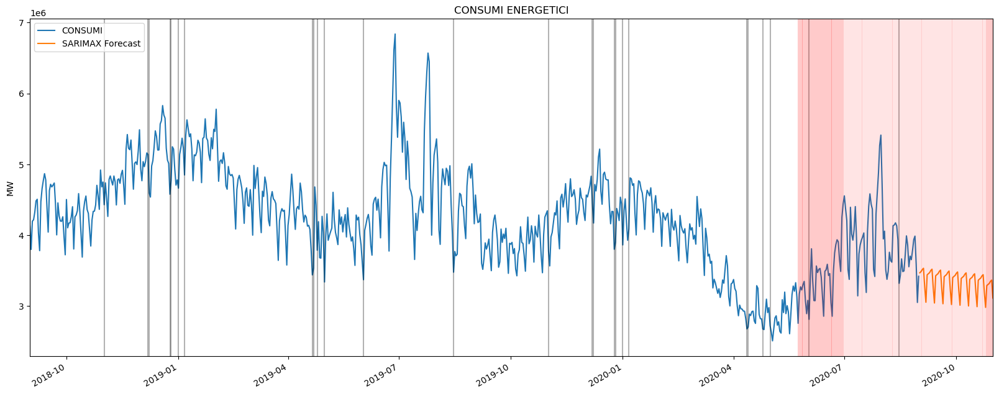

In [188]:
# Plot predictions against known values
title=f'CONSUMI ENERGETICI'
ylabel='MW'
xlabel=''
df_h.rename({'Y': 'CONSUMI'}, axis=1, inplace= True)
ax = df_h['CONSUMI'].plot(legend=True,figsize=(20,8),title=title)
fcast.plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
for x in df_h.query('dummy_holiday==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3);
for x in exog_f_f.query('dummy_holiday==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3);
for x in df_h[-100:].query('dummy_Covid==1').index: 
    ax.axvline(x=x, color='red', alpha = 0.2);
for x in df_h[-100:].query('dummy_Covid==0.5').index: 
    ax.axvline(x=x, color='red', alpha = 0.1);
for x in exog_f_f.query('dummy_Covid==1').index: 
    ax.axvline(x=x, color='red', alpha = 0.2);
for x in exog_f_f.query('dummy_Covid==0.5').index: 
    ax.axvline(x=x, color='red', alpha = 0.1);

# SARIMAX hh:24

In [189]:
df_h.rename({'CONSUMI': 'Y'}, axis=1, inplace= True)

In [190]:
df_fpre = df_cal_holiday.copy()
df_fpre = df_fpre.set_index('DATA')

In [191]:
def SATIMAX_h(ora, order, seasonal_order):
    start_t = time.time()
    
    # filter df by hour
    df_h = df[df.index.hour == ora]
    df_h.index = df_h.index.date
    df_h.rename({'VALORE': 'Y'}, axis=1, inplace= True)

    # SARIMAX parameters
    #Msarima = pmdarima.auto_arima(df_h[['Y']], exogenous=df_h[['dummy_holiday', 'dummy_Covid']], seasonal=True, m=7, scoring = 'mae')
    #par = Msarima.get_params()
    #order = par['order']
    #seasonal_order = par['seasonal_order']

    # SARIMAX model
    model = SARIMAX(df_h['Y'], exog=df_h[['dummy_holiday', 'dummy_Covid']].values, order=order, seasonal_order=seasonal_order, trend='n')
    results = model.fit()

    # predicted values
    start = '2020-09-01'
    end = '2020-10-31'
    exog_forecast = df_fpre.loc[start : end][['dummy_holiday', 'dummy_Covid']] 
    predictions = results.predict(start=len(df_h), end=len(df_h) + exog_forecast.shape[0]-1, exog=exog_forecast, dynamic = True).rename('SARIMAX Predictions')

    end_t = time.time()
    print(f'tempo di esecuzione modello SARIMAX hh_{ora} : {end_t - start_t} s')
    print(f'\nhh_{ora}')
    results.summary()
    return predictions, results

In [192]:
list_hour = list(range(24))
SeriesFor = [[] for x in range(24)]
namesofMySeriesFor = []
for i in list_hour:
    SeriesFor[i], results = SATIMAX_h( i, order, seasonal_order)
    SeriesFor.append(SeriesFor[i])
    namesofMySeriesFor.append(list_hour[i])
    print(results.summary().tables[0])
    print(results.summary().tables[1])
    print('======== Forecast ========')
    print()
    print(SeriesFor[i])

tempo di esecuzione modello SARIMAX hh_0 : 0.796649694442749 s

hh_0
                                      SARIMAX Results                                      
Dep. Variable:                                   Y   No. Observations:                  731
Model:             SARIMAX(2, 1, 0)x(1, 0, [1], 7)   Log Likelihood               -9837.369
Date:                             Thu, 03 Jun 2021   AIC                          19688.737
Time:                                     23:50:46   BIC                          19720.888
Sample:                                 09-01-2018   HQIC                         19701.141
                                      - 08-31-2020                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1          1.293e+05   2.85e+04     

In [193]:
mySeries = []
namesofMySeries = []
list_df = [pd.DataFrame() for x in range(24)]
for i in list_hour:
    df_h = df[df.index.hour == i][['VALORE']]
    df_h.index = df_h.index.date
    list_df[i] = df_h
    mySeries.append(list_df[i])
    namesofMySeries.append(list_hour[i])

In [194]:
l = []
sdate = date(2020, 9, 1) 
edate = date(2020, 10, 31) 
delta = edate - sdate       
for i in range(delta.days + 1):
    day = sdate + timedelta(days=i)
    l.append(day)

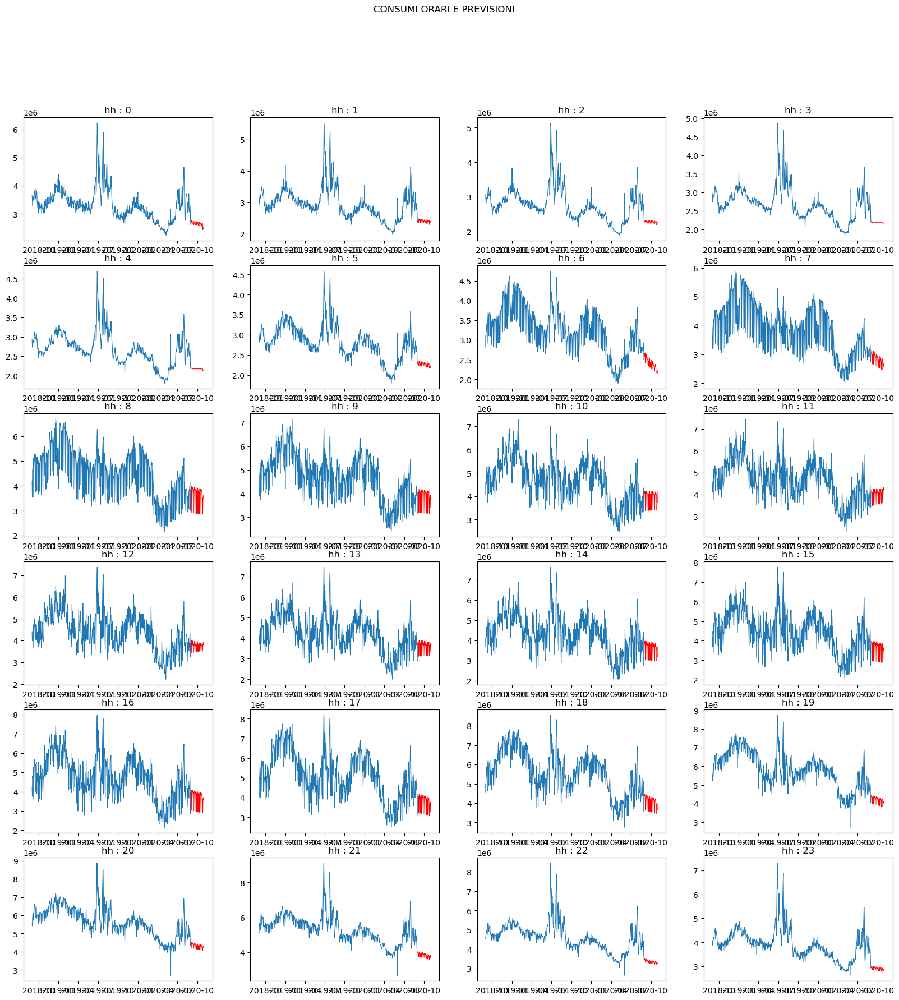

In [195]:
fig, axs = plt.subplots(6,4,figsize=(20,20))
fig.suptitle('CONSUMI ORARI E PREVISIONI')
for i in range(6):
    for j in range(4):
        if i*4+j+1>len(SeriesFor): # pass the others that we can't fill
            continue
        axs[i, j].plot(mySeries[i*4+j]['VALORE'], linewidth = 0.8)
        axs[i, j].plot((SeriesFor[i*4+j]), color = 'r', linewidth = 0.8)
        axs[i, j].set_title('hh : ' + str(namesofMySeries[i*4+j]))
plt.show()

In [196]:
mySeriesComp = []
namesofMySeries = []

for i in list_hour:
    df_h = df[df.index.hour == i][['VALORE']]
    df_h.index = df_h.index.date
    list_df[i] = df_h
    mySeries.append(list_df[i])
    namesofMySeries.append(list_hour[i])

In [197]:
mySeriesComp = [pd.DataFrame() for x in range(24)]
for i in list_hour:
    dfFor = pd.DataFrame(SeriesFor[i])
    dfFor.index = dfFor.index.date
    dfFor.columns = ['VALORE']
    mySeriesComp[i] = pd.concat([mySeries[i], dfFor], axis=0)

In [198]:
lista = []
for i in range(len(mySeriesComp[0])):
    for j in list_hour:
        lista.append(float(mySeriesComp[j].iloc[i]))

In [199]:
dfcompleto = pd.DataFrame(lista)

In [200]:
df_cal_comp = pd.DataFrame(
        {'DATE_TIME': pd.date_range('2018-09-01', '2020-11-01', freq='1H', closed='left')}
     )

In [201]:
dfcompleto1 = pd.concat([df_cal_comp, dfcompleto], axis=1)

In [202]:
dfcompleto1 = dfcompleto1.set_index('DATE_TIME')
dfcompleto1.columns = ['VALORE']
dfcompleto1["DATA"] = dfcompleto1.index.date
dfcompleto1["Ora"] = dfcompleto1.index.hour
dfcompleto1["Ora"] = dfcompleto1["Ora"].astype(int)
dfcompleto1["Ora"] = dfcompleto1["Ora"] +1

dfcompleto1 = dfcompleto1[['DATA', 'Ora', 'VALORE']]

In [203]:
listaFor = []
for i in range(len(SeriesFor[0])):
    for j in list_hour:
        listaFor.append(float(SeriesFor[j].iloc[i]))

In [204]:
dfFor = pd.DataFrame(listaFor)

In [205]:
df_cal_For = pd.DataFrame(
        {'DATE_TIME': pd.date_range('2020-09-01', '2020-11-01', freq='1H', closed='left')}
     )

In [206]:
dfcompletofor = pd.concat([df_cal_For, dfFor], axis=1)

In [207]:
dfcompletofor = dfcompletofor.set_index('DATE_TIME')
dfcompletofor.columns = ['VALORE']
dfcompletofor["DATA"] = dfcompletofor.index.date
dfcompletofor["Ora"] = dfcompletofor.index.hour
dfcompletofor["Ora"] = dfcompletofor["Ora"].astype(int)
dfcompletofor["Ora"] = dfcompletofor["Ora"] +1

dfcompletofor = dfcompletofor[['DATA', 'Ora', 'VALORE']]

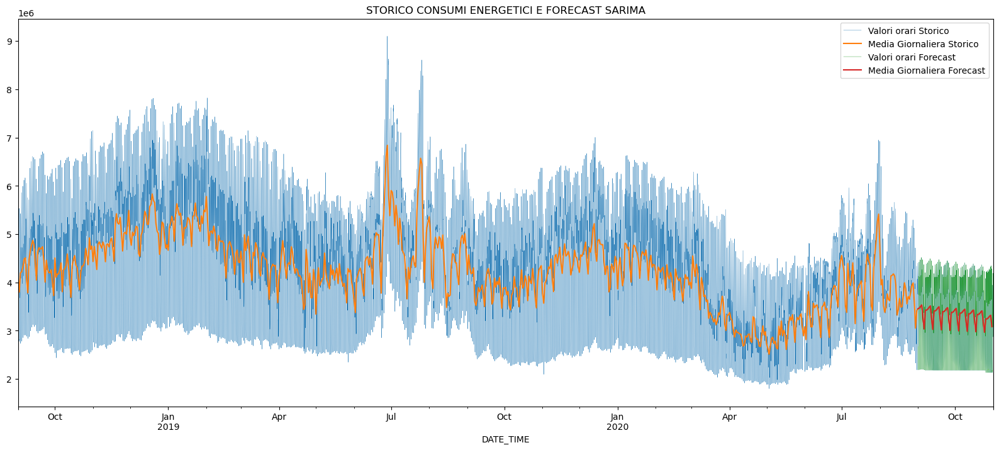

In [208]:
title=f'STORICO CONSUMI ENERGETICI E FORECAST SARIMA'
ylabel='MW'
xlabel=''
ax = dfcompleto1['VALORE'].plot(legend=True, figsize=(20,8), label='Valori orari Storico' , title=title, linewidth=0.3)
dfcompleto1['VALORE'].resample('d').mean().plot(label='Media Giornaliera Storico', legend=True)
dfcompletofor['VALORE'].plot(label='Valori orari Forecast', legend=True, linewidth=0.3)
dfcompletofor['VALORE'].resample('d').mean().plot(label='Media Giornaliera Forecast', legend=True);

In [209]:
#dfcompleto1.to_csv('OUTPUT/SARIMAX.csv', sep=';', decimal=',', index = False)

## SARIMAX Training

In [210]:
lentrain = round(df_h.shape[0]*0.8)

In [211]:
dfTrain = df.iloc[:(lentrain*24), :]
dfTest = df.iloc[(lentrain*24):, :]

In [212]:
dfTrain.index.min(), dfTrain.index.max() ,dfTest.index.min() , dfTest.index.max() 

(Timestamp('2018-09-01 00:00:00', freq='H'),
 Timestamp('2020-04-07 23:00:00', freq='H'),
 Timestamp('2020-04-08 00:00:00', freq='H'),
 Timestamp('2020-08-31 23:00:00', freq='H'))

In [213]:
df_h = dfTrain.resample('d').mean()
df_h.index = df_h.index.date
df_h.columns = ['Y', 'dummy_holiday','dummy_Covid']

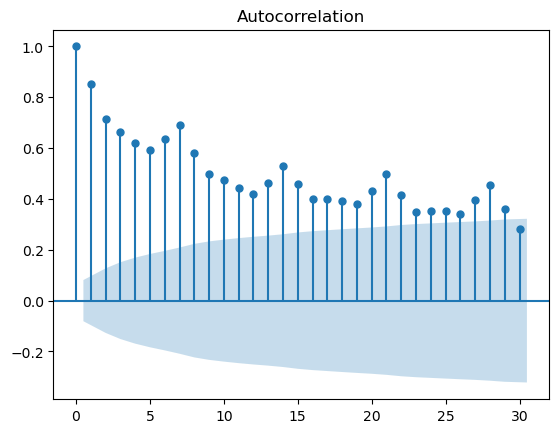

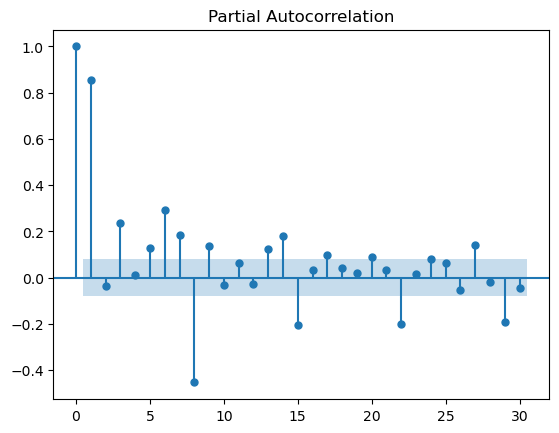

In [214]:
# Draw ACF and PACF Plot Charts
plot_acf(df_h[['Y']].values.squeeze(), lags=30)
plot_pacf(df_h[['Y']].values.squeeze(), lags=30)
plt.show()

In [215]:
Msarima = pmdarima.auto_arima(df_h[['Y']],
                              exogenous=df_h[['dummy_holiday', 'dummy_Covid']],
                              seasonal=True, m=7,
                              max_p = 2,
                              scoring = 'mae')

In [216]:
par = Msarima.get_params()
order = par['order']
seasonal_order = par['seasonal_order']
order, seasonal_order

((1, 1, 2), (2, 0, 2, 7))

In [217]:
def SATIMAX_Trainh(ora, order, seasonal_order):
    start_t = time.time()
    
    # filter df by hour
    df_h = dfTrain[dfTrain.index.hour == ora]
    df_h.index = df_h.index.date
    df_h.rename({'VALORE': 'Y'}, axis=1, inplace= True)

    # SARIMAX model
    model = SARIMAX(df_h['Y'], exog=df_h[['dummy_holiday', 'dummy_Covid']].values, order=order, seasonal_order=seasonal_order, trend='n')
    results = model.fit()

    # predicted values
    start = '2020-04-08'
    end = '2020-08-31'
    exog_forecast = df_fpre.loc[start : end][['dummy_holiday', 'dummy_Covid']] 
    predictions = results.predict(start=len(df_h), end=len(df_h) + exog_forecast.shape[0]-1, exog=exog_forecast, dynamic = True).rename('SARIMAX Predictions')

    end_t = time.time()
    print(f'tempo di esecuzione modello SARIMAX hh_{ora} : {end_t - start_t} s')
    print(f'\nhh_{ora}')
    results.summary()
    return predictions, results

In [218]:
list_hour = list(range(24))
SeriesFor = [[] for x in range(24)]
namesofMySeriesFor = []
for i in list_hour:
    SeriesFor[i], results = SATIMAX_Trainh( i, order, seasonal_order)
    SeriesFor.append(SeriesFor[i])
    namesofMySeriesFor.append(list_hour[i])
    print(results.summary().tables[0])
    print(results.summary().tables[1])
    print('======== Forecast ========')
    print()
    print(SeriesFor[i])

tempo di esecuzione modello SARIMAX hh_0 : 3.066035747528076 s

hh_0
                                     SARIMAX Results                                     
Dep. Variable:                                 Y   No. Observations:                  585
Model:             SARIMAX(1, 1, 2)x(2, 0, 2, 7)   Log Likelihood               -7850.437
Date:                           Thu, 03 Jun 2021   AIC                          15720.874
Time:                                   23:52:22   BIC                          15764.573
Sample:                               09-01-2018   HQIC                         15737.906
                                    - 04-07-2020                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1          1.764e+05    3.3e+04      5.341      0.00

In [219]:
mySeries = []
namesofMySeries = []
list_df = [pd.DataFrame() for x in range(24)]
for i in list_hour:
    df_h = dfTrain[dfTrain.index.hour == i][['VALORE']]
    df_h.index = df_h.index.date
    list_df[i] = df_h
    mySeries.append(list_df[i])
    namesofMySeries.append(list_hour[i])

In [220]:
l = []
sdate = date(2020, 4, 8) 
edate = date(2020, 8, 31) 
delta = edate - sdate       
for i in range(delta.days + 1):
    day = sdate + timedelta(days=i)
    l.append(day)

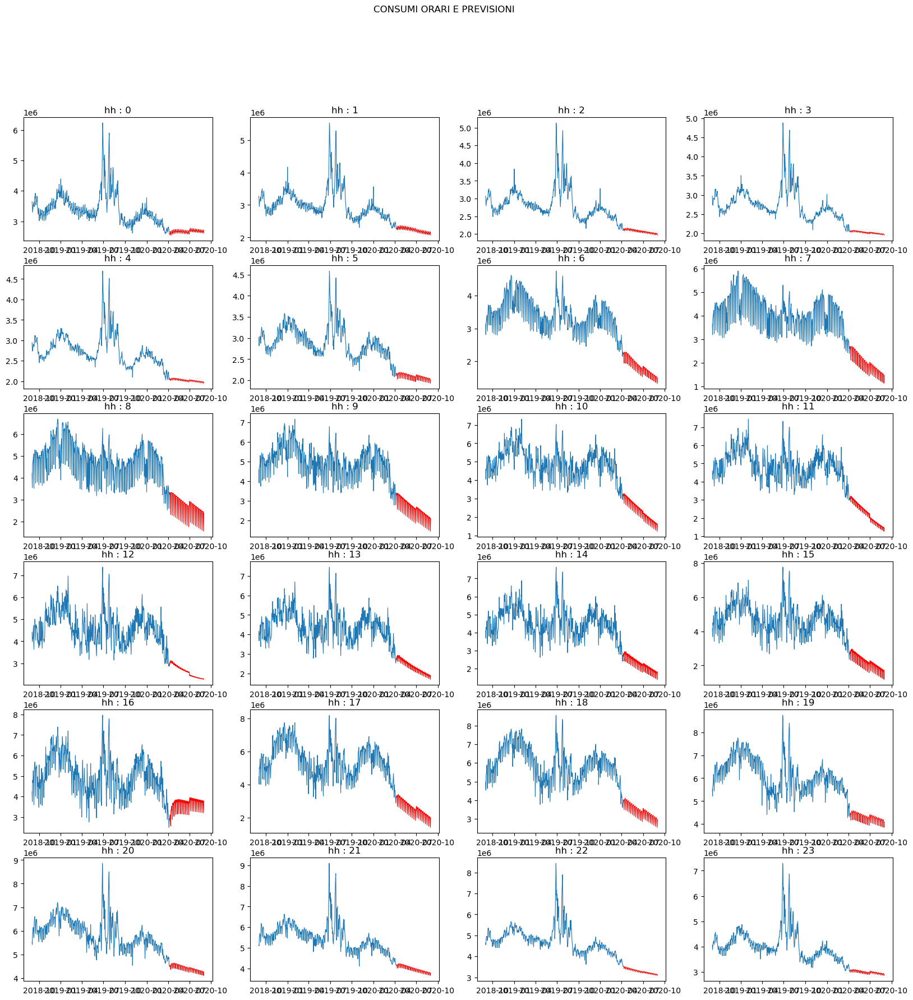

In [221]:
fig, axs = plt.subplots(6,4,figsize=(20,20))
fig.suptitle('CONSUMI ORARI E PREVISIONI')
for i in range(6):
    for j in range(4):
        if i*4+j+1>len(SeriesFor): 
            continue
        axs[i, j].plot(mySeries[i*4+j]['VALORE'], linewidth = 0.8)
        axs[i, j].plot((SeriesFor[i*4+j]), color = 'r', linewidth = 0.8)
        axs[i, j].set_title('hh : ' + str(namesofMySeries[i*4+j]))
plt.show()

In [222]:
mySeriesComp = []
namesofMySeries = []

for i in list_hour:
    df_h = dfTrain[dfTrain.index.hour == i][['VALORE']]
    df_h.index = df_h.index.date
    list_df[i] = df_h
    mySeries.append(list_df[i])
    namesofMySeries.append(list_hour[i])

In [223]:
mySeriesComp = [pd.DataFrame() for x in range(24)]
for i in list_hour:
    dfFor = pd.DataFrame(SeriesFor[i])
    dfFor.index = dfFor.index.date
    dfFor.columns = ['VALORE']
    mySeriesComp[i] = pd.concat([mySeries[i], dfFor], axis=0)

In [224]:
lista = []
for i in range(len(mySeriesComp[0])):
    for j in list_hour:
        lista.append(float(mySeriesComp[j].iloc[i]))

In [225]:
dfcompleto = pd.DataFrame(lista)

In [226]:
df_cal_comp = pd.DataFrame(
        {'DATE_TIME': pd.date_range('2018-09-01', '2020-09-01', freq='1H', closed='left')}
     )

In [227]:
dfcompleto1 = pd.concat([df_cal_comp, dfcompleto], axis=1)

In [228]:
dfcompleto1 = dfcompleto1.set_index('DATE_TIME')
dfcompleto1.columns = ['VALORE']
dfcompleto1["DATA"] = dfcompleto1.index.date
dfcompleto1["Ora"] = dfcompleto1.index.hour
dfcompleto1["Ora"] = dfcompleto1["Ora"].astype(int)
dfcompleto1["Ora"] = dfcompleto1["Ora"] +1

dfcompletoTrain = dfcompleto1[['DATA', 'Ora', 'VALORE']]

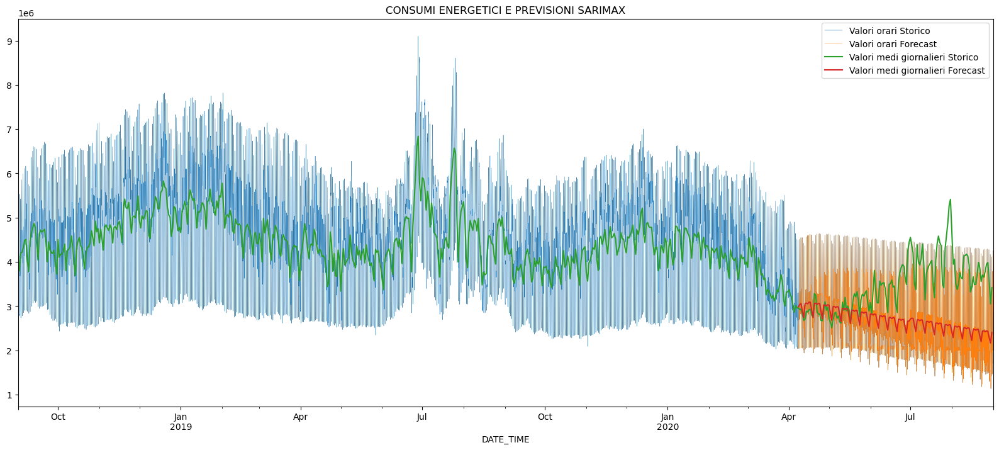

In [229]:
title=f'CONSUMI ENERGETICI E PREVISIONI SARIMAX'
ylabel='MW'
xlabel=''
ax = dfcompletoTrain['VALORE'].plot(legend=True,figsize=(20,8), label='Valori orari Storico' ,title=title, linewidth=0.3)
dfcompletoTrain.loc['2020-04-08':]['VALORE'].plot(label='Valori orari Forecast', linewidth=0.3, legend=True)
df['VALORE'].resample('d').mean().plot(label='Valori medi giornalieri Storico', legend=True)
dfcompletoTrain.loc['2020-04-08':]['VALORE'].resample('d').mean().plot(label='Valori medi giornalieri Forecast', legend=True);

In [230]:
df.loc['2020-04-08':][['VALORE']], dfcompletoTrain.loc['2020-04-08':][['VALORE']]

(                        VALORE
 DATE_TIME                     
 2020-04-08 00:00:00  2560327.0
 2020-04-08 01:00:00  2251664.0
 2020-04-08 02:00:00  2096540.0
 2020-04-08 03:00:00  2040282.0
 2020-04-08 04:00:00  2040261.0
 ...                        ...
 2020-08-31 19:00:00  4284919.0
 2020-08-31 20:00:00  4400006.0
 2020-08-31 21:00:00  3965396.0
 2020-08-31 22:00:00  3442262.0
 2020-08-31 23:00:00  2932544.0
 
 [3504 rows x 1 columns],
                            VALORE
 DATE_TIME                        
 2020-04-08 00:00:00  2.579322e+06
 2020-04-08 01:00:00  2.270119e+06
 2020-04-08 02:00:00  2.112002e+06
 2020-04-08 03:00:00  2.046485e+06
 2020-04-08 04:00:00  2.043651e+06
 ...                           ...
 2020-08-31 19:00:00  4.093576e+06
 2020-08-31 20:00:00  4.255753e+06
 2020-08-31 21:00:00  3.773900e+06
 2020-08-31 22:00:00  3.130085e+06
 2020-08-31 23:00:00  2.901685e+06
 
 [3504 rows x 1 columns])

In [231]:
mse = mean_squared_error(df.loc['2020-04-08':]['VALORE'], dfcompletoTrain.loc['2020-04-08':]['VALORE'])
print(f'Valore MSE: {mse}')

Valore MSE: 1373496087796.6792


In [232]:
mae = mean_absolute_error(df.loc['2020-04-08':'2020-08-31']['VALORE'], dfcompletoTrain.loc['2020-04-08':'2020-08-31']['VALORE'])
print(f'Valore MAE: {mae}')

Valore MAE: 877425.3701364229


# TBATS 

Exponential smoothing state space model with Box-Cox transformation, ARMA errors, Trend and Seasonal components,    
TBATS do not allow for exogenous variables,    
https://pkg.robjhyndman.com/forecast/reference/tbats.html

In [233]:
help(TBATS)

Help on class TBATS in module tbats.tbats.TBATS:

class TBATS(tbats.abstract.Estimator.Estimator)
 |  TBATS(use_box_cox=None, box_cox_bounds=(0, 1), use_trend=None, use_damped_trend=None, seasonal_periods=None, use_arma_errors=True, show_warnings=True, n_jobs=None, multiprocessing_start_method='spawn', context=None)
 |  
 |  TBATS estimator used to fit and select best performing model.
 |  
 |  TBATS (Exponential smoothing state space model with Box-Cox
 |  transformation, ARMA errors, Trigonometric Trend and Seasonal components.)
 |  
 |  Model has been described in De Livera, Hyndman & Snyder (2011).
 |  
 |  All of the useful methods have been implemented in parent Estimator class.
 |  
 |  Method resolution order:
 |      TBATS
 |      tbats.abstract.Estimator.Estimator
 |      sklearn.base.BaseEstimator
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, use_box_cox=None, box_cox_bounds=(0, 1), use_trend=None, use_damped_trend=None, seasonal_periods=None

In [234]:
df_TBATS = df.loc[:'2020-04-07'][['VALORE']].copy()
df_TBATS = df_TBATS.resample('d').mean()
df_TBATS.index = df_TBATS.index.date

In [235]:
def TABTS_For(df_TBATS, ora):
    start = time.time()
    estimator = TBATS(seasonal_periods=(7, 183), use_trend = False, use_box_cox=False) # stagionalità annuale 365/2
    model = estimator.fit(df_TBATS)
    y_forecast = model.forecast(steps=365)
    dfy_for = pd.DataFrame(data=y_forecast, columns=['Y'])
    print(model.summary())
    end = time.time()
    print(f'tempo di esecuzione modello TBATS hh_{ora} : {end - start} s')
    return dfy_for

In [236]:
list_hour = list(range(0,24))
list_df_for = [pd.DataFrame() for x in range(24)]
SeriesFor = []
namesofMySeriesFor = []
for i in list_hour:
    list_df_for[i] = TABTS_For(mySeries[i], i)
    list_df_for[i]['h'] = list_hour[i]
    SeriesFor.append(list_df_for[i])
    namesofMySeriesFor.append(list_hour[i])
    print('===============================')

Use Box-Cox: False
Use trend: False
Use damped trend: False
Seasonal periods: [  7. 183.]
Seasonal harmonics [3 1]
ARMA errors (p, q): (0, 0)
Smoothing (Alpha): 1.035080
Seasonal Parameters (Gamma): [-8.59849628e-08 -1.17339903e-07  5.51811740e-08 -3.56917571e-07]
AR coefficients []
MA coefficients []
Seed vector [3699270.02674621   75295.31981711   50295.80030983  -25623.76769762
   -9200.13713916   44753.74611798   30066.38330401  -40160.30305311
 -422071.70974289]

AIC 17799.731515
tempo di esecuzione modello TBATS hh_0 : 53.912355184555054 s
Use Box-Cox: False
Use trend: False
Use damped trend: False
Seasonal periods: [  7. 183.]
Seasonal harmonics [3 1]
ARMA errors (p, q): (0, 0)
Smoothing (Alpha): 1.031331
Seasonal Parameters (Gamma): [-8.57581849e-08 -1.16910391e-07  5.65910127e-08 -3.55220330e-07]
AR coefficients []
MA coefficients []
Seed vector [3298481.90811281   54159.02372782   41820.60763012  -16245.22003187
  -12198.31980481   31406.94348015   22925.45275213  -15317.6795

In [237]:
l = []
sdate = date(2020, 4, 7) 
edate = date(2020, 8, 31) 
delta = edate - sdate       
for i in range(delta.days + 1):
    day = sdate + timedelta(days=i)
    l.append(day)

In [238]:
list_df_prev = [pd.DataFrame() for x in range(24)]
SeriesPrev = []
namesofMySeriesPrev = []
for i in list_hour:
    list_df_prev[i] = pd.DataFrame(list(zip(l, SeriesFor[i]['Y'].values)), columns =['DATA', 'VALORE'])
    list_df_prev[i] = list_df_prev[i].set_index(pd.DatetimeIndex(list_df_prev[i]['DATA']))
    list_df_prev[i] = list_df_prev[i].drop(['DATA'], axis=1)
    SeriesPrev.append(list_df_prev[i])
    namesofMySeriesPrev.append(list_hour[i])

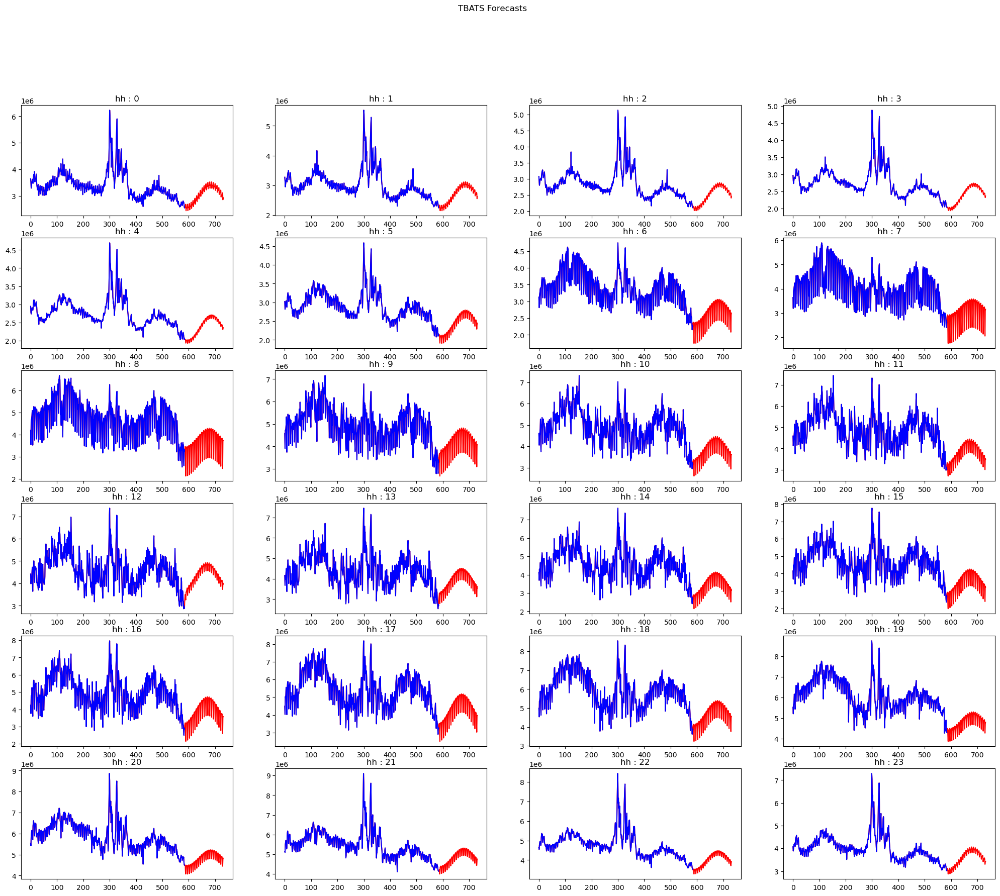

In [239]:
fig, axs = plt.subplots(6,4,figsize=(25,20))
fig.suptitle(f'TBATS Forecasts')
for i in range(6):
    for j in range(4):
        if i*4+j+1>len(SeriesPrev): # pass the others that we can't fill
            continue
        axs[i, j].plot(np.append(mySeries[i*4+j].values , SeriesPrev[i*4+j][['VALORE']].values), c='r')
        axs[i, j].plot(mySeries[i*4+j].values, c='b')
        axs[i, j].set_title('hh : ' + str(namesofMySeriesPrev[i*4+j]))
plt.show()

In [240]:
mySeriesComp1 = [pd.DataFrame() for x in range(24)]
for i in list_hour:
    dfFor = pd.DataFrame(SeriesPrev[i])
    dfFor.index = dfFor.index.date
    dfFor.columns = ['VALORE']
    mySeriesComp1[i] = pd.concat([mySeries[i], dfFor], axis=0)

In [241]:
lista1 = []
for i in range(len(mySeriesComp1[0])):
    for j in list_hour:
        lista1.append(float(mySeriesComp1[j].iloc[i]))

In [258]:
dfcompleto1 = pd.DataFrame(lista1, columns=['VALORE'])

In [259]:
df_cal_comp11 = pd.DataFrame( {'DATE_TIME': pd.date_range('2018-09-01', '2020-10-31', freq='1H', closed='left')} )

In [260]:
dfcompleto2 = pd.concat([df_cal_comp11, dfcompleto1], axis=1)
dfcompleto2 = dfcompleto2[['DATE_TIME','VALORE']]
dfcompleto2 = dfcompleto2.set_index('DATE_TIME')
dfcompleto2.columns = ['VALORE']

In [261]:
dfcompleto2["DATA"] = dfcompleto2.index.date
dfcompleto2["Ora"] = dfcompleto2.index.hour
dfcompleto2["Ora"] = dfcompleto2["Ora"].astype(int)
dfcompleto2["Ora"] = dfcompleto2["Ora"] +1

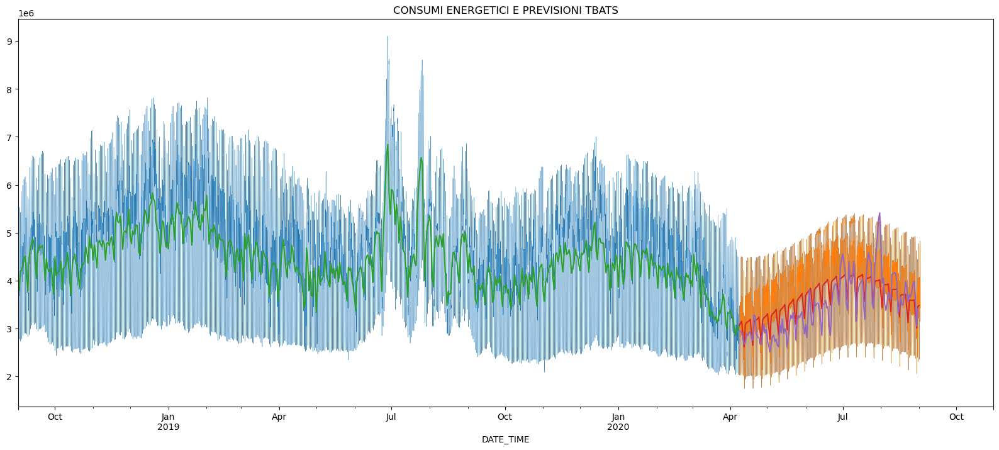

In [264]:
title=f'CONSUMI ENERGETICI E PREVISIONI TBATS'
ylabel='MW'
xlabel=''
ax = dfcompleto2['VALORE'].plot(legend=False,figsize=(20,8),title=title, linewidth=0.3)
dfcompleto2.loc['2020-04-08':]['VALORE'].plot( linewidth=0.3)
dfcompleto2.loc[:'2020-04-08']['VALORE'].resample('d').mean().plot()
dfcompleto2.loc['2020-04-08':]['VALORE'].resample('d').mean().plot()
df.loc['2020-04-08':]['VALORE'].resample('d').mean().plot();

In [265]:
maeTBATS = mean_absolute_error(df.loc['2020-04-08':'2020-08-31']['VALORE'], dfcompleto2.loc['2020-04-08':'2020-08-31']['VALORE'])
print(f'Valore MAE TBATS: {maeTBATS}')

Valore MAE TBATS: 382981.6213457273


# 1.3 fbPhrophet

In [266]:
help(Prophet)

Help on class Prophet in module fbprophet.forecaster:

class Prophet(builtins.object)
 |  Prophet(growth='linear', changepoints=None, n_changepoints=25, changepoint_range=0.8, yearly_seasonality='auto', weekly_seasonality='auto', daily_seasonality='auto', holidays=None, seasonality_mode='additive', seasonality_prior_scale=10.0, holidays_prior_scale=10.0, changepoint_prior_scale=0.05, mcmc_samples=0, interval_width=0.8, uncertainty_samples=1000, stan_backend=None)
 |  
 |  Prophet forecaster.
 |  
 |  Parameters
 |  ----------
 |  growth: String 'linear' or 'logistic' to specify a linear or logistic
 |      trend.
 |  changepoints: List of dates at which to include potential changepoints. If
 |      not specified, potential changepoints are selected automatically.
 |  n_changepoints: Number of potential changepoints to include. Not used
 |      if input `changepoints` is supplied. If `changepoints` is not supplied,
 |      then n_changepoints potential changepoints are selected uniforml

In [267]:
df_c = df[['VALORE']]
df_f = df[['VALORE', 'dummy_Covid']].loc[:'2020-04-07']

In [268]:
df_f.reset_index(inplace=True)

In [269]:
df_f.columns = ['ds','y','Covid']

In [270]:
m = Prophet(seasonality_mode='multiplicative',
            yearly_seasonality=True,
            weekly_seasonality=True,
            daily_seasonality=True,
            growth='flat')

m_ex = Prophet(seasonality_mode='multiplicative',
            yearly_seasonality=True,
            weekly_seasonality=True,
            daily_seasonality=True,
            growth='flat')

In [271]:
m_ex.add_regressor('Covid', prior_scale=0.5, mode='multiplicative')
m_ex.add_country_holidays(country_name='IT')

m.add_country_holidays(country_name='IT');

In [272]:
m_ex.fit(df_f)

m.fit(df_f[['ds','y']]);

In [273]:
future = m.make_future_dataframe(periods=24*147, freq='H')

future_ex = m_ex.make_future_dataframe(periods=24*147, freq='H')

In [274]:
# Add Exogenous variable (Covid Impact)
# Dpcm del 24 ottobre
future_ex['Covid'] = np.where((future_ex['ds'] >= '2020-03-01') & (future_ex['ds'] <= '2020-07-01') | (future_ex['ds'] >= '2020-10-26'), 1, 0 )

In [275]:
forecast = m.predict(future)

forecast_ex = m_ex.predict(future_ex)

In [276]:
forecast_f = forecast[(forecast['ds'] >= '2020-04-08') &((forecast['ds'] <= '2020-08-31'))]

forecast_f_ex = forecast_ex[(forecast['ds'] >= '2020-04-08') &((forecast['ds'] <= '2020-08-31'))]

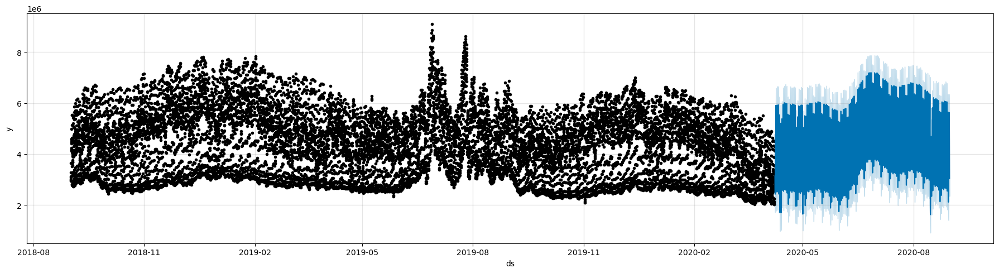

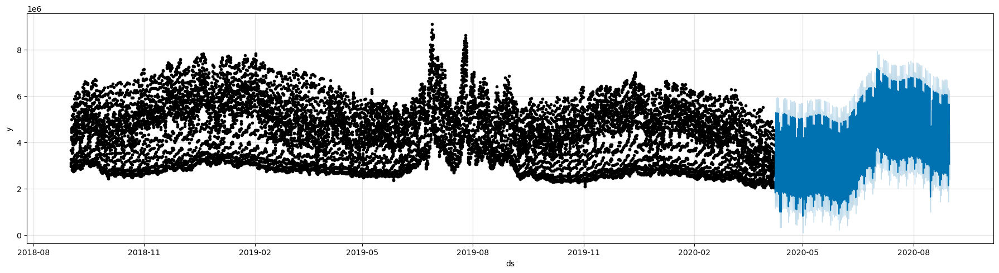

In [277]:
fig1 = m.plot(forecast_f, figsize=(18,5), uncertainty=True)
fig2 = m_ex.plot(forecast_f_ex, figsize=(18,5), uncertainty=True)


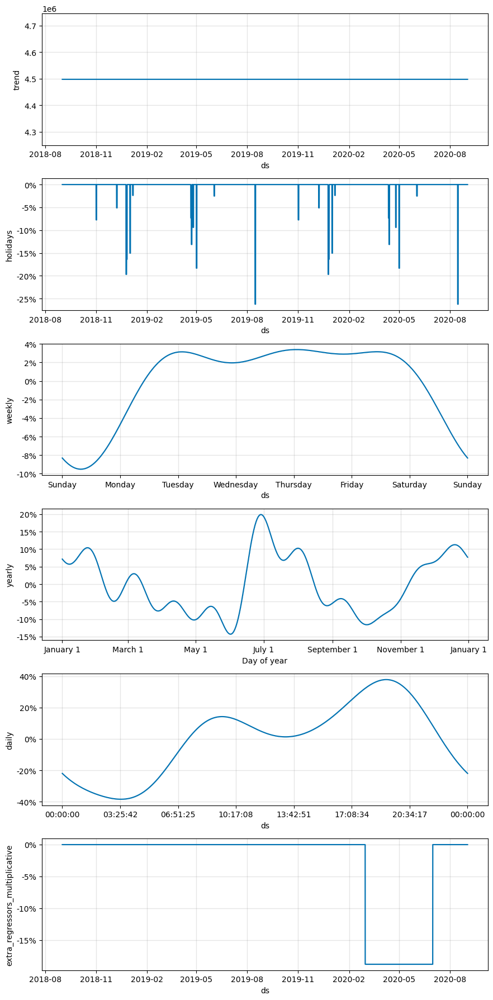

In [278]:
fig3 = m_ex.plot_components(forecast_ex)

In [279]:
forecast = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast['ds'] = pd.to_datetime(forecast['ds'], format='%Y-%m-%d')
forecast = forecast.set_index('ds')

forecast_ex = forecast_ex[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_ex['ds'] = pd.to_datetime(forecast_ex['ds'], format='%Y-%m-%d')
forecast_ex = forecast_ex.set_index('ds')

In [280]:
df_f = df_f.set_index('ds')
forecast.rename(columns = {'yhat' : 'fbProphet Forecast', 'yhat_lower' : 'fbProphet Forecast Lower bound',  'yhat_upper' : 'fbProphet Forecast Upper bound'}, inplace = True)

forecast_ex.rename(columns = {'yhat' : 'fbProphet Forecast', 'yhat_lower' : 'fbProphet Forecast Lower bound',  'yhat_upper' : 'fbProphet Forecast Upper bound'}, inplace = True)

In [281]:
df_f = pd.merge(df_f, forecast, left_index=True, right_index=True , how='right')

df_f_ex = pd.merge(df_f, forecast_ex, left_index=True, right_index=True , how='right')

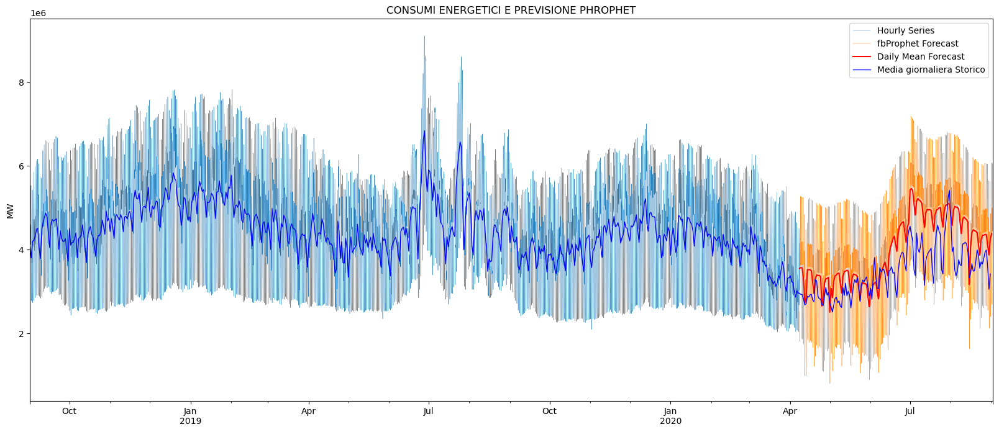

In [282]:
# Plot the forecasted values alongside the original data
title=f'CONSUMI ENERGETICI E PREVISIONE PHROPHET'
ylabel='MW'
xlabel='' 
forecast1 = forecast_ex.loc['2020-04-08':]
df_f_ex.rename({'y': 'Hourly Series'}, axis=1, inplace= True)
ax = df_f_ex[df_f_ex.columns[0]].plot(figsize=(20,8),title=title, legend=True, linewidth=0.3)
df_f_ex.rename({'Hourly Series': 'Daily Mean Series'}, axis=1, inplace= True)
forecast1['fbProphet Forecast'].plot(legend=True, linewidth=0.3)
forecast1.rename({'fbProphet Forecast': 'Daily Mean Forecast'}, axis=1, inplace= True)
forecast1[forecast1.columns[0]].resample('d').mean().plot(c='red',legend=True)
df_c['VALORE'].resample('d').mean().plot(legend=True, linewidth=1, c='b', label ='Media giornaliera Storico')
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);

In [283]:
maePHROPHET = mean_absolute_error(df.loc['2020-04-08':'2020-08-31']['VALORE'], forecast1.loc['2020-04-08':'2020-08-31'][forecast1.columns[0]])
print(f'Valore MAE PHROPHET: {maePHROPHET}')

Valore MAE PHROPHET: 682505.6594426872
